In [1]:
import numpy as np
import openai
import pandas as pd
import os
import anthropic
import re
import time


# Putting together the database

In [ ]:
promises = pd.read_csv("../data/sxp1500_presentations_ceo_aggregated_promises_expanded_cleaned_transcriptlevel_horizon_specificity.csv")

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_361/2671568783.py:1: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  promises = pd.read_csv("../data/LIWC-22 Results - sxp1500_presentations_ceo_aggr___ - LIWC Analysis_v11_horizon_v2_specificity.csv")


In [3]:
# create promise_id column, it is gvkey_transcriptid_2digitnumber (01, 02, 03, ...)

promises['promise_id'] = promises.groupby(['gvkey', 'transcriptid']).cumcount() + 1
promises['promise_id'] = promises['gvkey'].astype(str) + '_' + promises['transcriptid'].astype(str) + '_' + promises['promise_id'].apply(lambda x: f'{x:02d}')



In [4]:
list(promises.columns)

['Unnamed: 0',
 'transcriptid',
 'transcriptcomponentid_list',
 'audiolengthsec',
 'companyid',
 'companyname',
 'companyofperson',
 'componentorder',
 'componenttextpreview',
 'delayreasontypeid',
 'delayreasontypename',
 'exec_fullname',
 'execid',
 'gvkey',
 'headline',
 'is_ceo',
 'isdelayed_flag',
 'keydeveventtypeid',
 'keydeveventtypename',
 'keydevid',
 'matched_name',
 'mostimportantdateutc',
 'mostimportanttimeutc',
 'proid',
 'speakertypeid',
 'speakertypename',
 'transcriptcollectiontypeid',
 'transcriptcollectiontypename',
 'transcriptcomponenttypeid',
 'transcriptcomponenttypename',
 'transcriptcreationdate_utc',
 'transcriptcreationtime_utc',
 'transcriptpersonid',
 'transcriptpersonname',
 'transcriptpresentationtypeid',
 'transcriptpresentationtypename',
 'word_count',
 'year',
 'transcript_text_len',
 'transcriptcomponentid_ceospeech',
 'processed',
 '3-promise-horizon-v2',
 '1-promise-verbatim',
 '2-promise-explain',
 '3-promise-delivery-time',
 '4-promise-horizon',


In [5]:
promises_select = promises[['gvkey', 'mostimportantdateutc', 'companyname', 'exec_fullname', 'promise_id','1-promise-verbatim' ,'2-promise-explain' ,'3-promise-horizon-v2', 'specificity_score']].sort_values(by=['gvkey', 'mostimportantdateutc',])



In [ ]:
promises_select.to_csv("../data/sxp1500_presentations_ceo_aggregated_promises_expanded_cleaned_transcriptlevel_horizon_specificity_specificity_select.csv", index=False)

In [6]:
labels = pd.read_csv("promises_with_keywords_v5_labels.csv")

In [7]:
labels.columns

Index(['transcriptid', 'companyname', 'gvkey', 'transcript_date',
       'speaker_name', 'presentation_len', 'year', 'full_transcript_len',
       'promise_verbatim', 'promise_explain', 'promise_id',
       'promise_horizon_months', 'keywords', 'keyword1', 'keyword2',
       'keyword3', 'keyword1_label', 'keyword2_label', 'keyword3_label',
       'primary_keyword'],
      dtype='object')

In [8]:
labels['promise_id']

0          10353_45212.0_05
1          11600_45248.0_01
2          25338_45259.0_01
3          25338_45259.0_02
4         146017_45297.0_01
                ...        
74012    66065_2875107.0_01
74013     1598_2875128.0_01
74014     6386_2875370.0_02
74015    66065_2875419.0_01
74016    66065_2875419.0_03
Name: promise_id, Length: 74017, dtype: object

In [9]:
def revert_promise_id(promise_id):
    # Split the promise_id into parts separated by underscore
    parts = promise_id.split('_')
    fixed_parts = []
    for part in parts:
        # If the part ends with '.0', convert it to an integer string
        if part.endswith('.0'):
            part = str(int(float(part)))
        fixed_parts.append(part)
    # Rejoin the parts with underscores
    return '_'.join(fixed_parts)

# Apply the function to the promise_id column
labels['promise_id'] = labels['promise_id'].apply(revert_promise_id)

In [10]:
labels['promise_id']

0          10353_45212_05
1          11600_45248_01
2          25338_45259_01
3          25338_45259_02
4         146017_45297_01
               ...       
74012    66065_2875107_01
74013     1598_2875128_01
74014     6386_2875370_02
74015    66065_2875419_01
74016    66065_2875419_03
Name: promise_id, Length: 74017, dtype: object

In [11]:
labels = labels[['promise_id', 'primary_keyword']]

# merge promises and labels on promise_id
promises = pd.merge(labels, promises, on=['promise_id'], how='left')

In [ ]:
reg_database = pd.read_csv("../data/sxp1500_presentations_ceo_aggregated_regression_vars.csv")

In [13]:
# Calculate earnings surprise price
reg_database['earnings_surprise_price'] = reg_database['earnings_surprise'] / reg_database['prccq']

# Using missed_forecast dummy
reg_database['miss_forecasts'] = 0
reg_database.loc[reg_database['earnings_surprise_price'] < 0, 'miss_forecasts'] = 1

In [14]:
reg_database = reg_database[['transcriptid', 'mostimportantdateutc', 'year', 'gvkey', 'companyname', 'execid', 'exec_fullname', 'ceo_tenure',  'ceo_gender_dummy',     'PRisk', 
    'trailing_12month_uncertainty_3component', 'uncertainty_ratio', 'fin_slack_raw','functional_background', 'at_log', 'firm_age', 'numest', 'EPS','earnings_surprise_price', 'miss_forecasts',  'earnings_volatility', 'leverage', 'rd_f', 'n_segments', 'market_share_sich4', 'strategy_unique', 'mergers', 'ceo_total_shares_owned_log', 'ceo_dual_dummy', 'positive_ratio', 'word_count_total_log', 'hhi_sich4_reverse_ind', 'sich4']]

In [15]:
reg_database['functional_background'].value_counts()

functional_background
Other/Unclear                             12472
Operations/Supply Chain                   11594
Finance/Accounting                         4791
Sales/Marketing                            1696
Technology/Product/Engineering/Science      774
Strategy                                    646
Legal/Compliance/Regulatory/Risk            566
Administrative                              188
Human Resources                              42
Name: count, dtype: int64

In [16]:
# merge using transcriptid
# make sure trascript id is int 
reg_database['transcriptid'] = reg_database['transcriptid'].astype(int)
promises['transcriptid'] = promises['transcriptid'].astype(int)
df_reg = promises.merge(reg_database, on="transcriptid", how="left")
df_reg.head()





,promise_id,primary_keyword,Unnamed: 0,transcriptid,transcriptcomponentid_list,audiolengthsec,companyid,companyname_x,companyofperson,componentorder,...,n_segments,market_share_sich4,strategy_unique,mergers,ceo_total_shares_owned_log,ceo_dual_dummy,positive_ratio,word_count_total_log,hhi_sich4_reverse_ind,sich4
0,10353_45212_05,Shareholder and Stakeholder Trust and Engagement,7,45212,"[3457811.0, 3457813.0]",3600.0,189424,"Team, Inc.",NaN,2,...,1.0,1.000000,0.000000,0.000,7.024293,1.0,0.021483,7.544332,0.000000,7600.0
1,11600_45248_01,Risk Management,9,45248,"[3460066.0, 3460069.0]",3480.0,314750,"Worthington Industries, Inc.",NaN,3,...,4.0,0.608182,0.024807,-0.232,9.213694,1.0,0.039711,6.302619,0.578956,3310.0
2,25338_45259_01,Experience Enhancement,10,45259,[3460878.0],2820.0,321778,Bed Bath & Beyond Inc.,NaN,4,...,1.0,0.544077,0.023555,0.000,6.777061,0.0,0.025852,6.709304,0.623534,5700.0
3,25338_45259_02,Investment,11,45259,[3460878.0],2820.0,321778,Bed Bath & Beyond Inc.,NaN,4,...,1.0,0.544077,0.023555,0.000,6.777061,0.0,0.025852,6.709304,0.623534,5700.0
4,146017_45297_01,Pricing and Rate Management,13,45297,"[3463260.0, 3463262.0]",4560.0,1413208,"Acuity Brands, Inc.",NaN,3,...,1.0,0.120122,0.018702,0.000,7.087475,1.0,0.030538,7.611348,0.792453,3640.0


In [17]:
df = df_reg[['promise_id',
 'primary_keyword',
 'transcriptid',
 'companyname_x',
 'exec_fullname_y',
 'execid_y',
 'gvkey_x',
 'mostimportantdateutc_x',
 'word_count',
 'year_x',
 '3-promise-horizon-v2',
 'Analytic',
 'quantity',
 'ceo_tenure',
 'ceo_gender_dummy',
 'PRisk',
 'trailing_12month_uncertainty_3component',
 'uncertainty_ratio',
 'fin_slack_raw',
 'functional_background',
 'at_log',
 'firm_age',
 'numest',
 'EPS','earnings_surprise_price', 'miss_forecasts', 
 'earnings_volatility',
 'leverage',
 'rd_f',
 'n_segments',
 'market_share_sich4',
 'strategy_unique',
 'mergers',
 'ceo_total_shares_owned_log',
 'ceo_dual_dummy',
 'positive_ratio',
 'word_count_total_log',
 'hhi_sich4_reverse_ind', 'sich4']]

In [18]:
df['mostimportantdateutc_x'] = pd.to_datetime(df['mostimportantdateutc_x'])
df['month'] = df['mostimportantdateutc_x'].dt.month

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_1815/3658153693.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['mostimportantdateutc_x'] = pd.to_datetime(df['mostimportantdateutc_x'])
/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_1815/3658153693.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df['mostimportantdateutc_x'].dt.month


In [19]:
# in the column 3-promise-horizon-v2, turn to int, if it is not a number, make it nan
df['3-promise-horizon-clean'] = df['3-promise-horizon-v2'].apply(lambda x: int(x) if str(x).isdigit() else np.nan)

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_1815/3513871697.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['3-promise-horizon-clean'] = df['3-promise-horizon-v2'].apply(lambda x: int(x) if str(x).isdigit() else np.nan)


In [20]:
df['3-promise-horizon-clean'] 

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
74012    5.0
74013    NaN
74014    7.0
74015    NaN
74016    NaN
Name: 3-promise-horizon-clean, Length: 74017, dtype: float64

In [21]:
# what percent is nan?
df['3-promise-horizon-clean'].isna().mean()



0.5147060810354378

In [22]:
df['sich2'] = pd.to_numeric(
    df['sich4'].astype(str).str.zfill(2).str[:2], # Convert to string, pad, slice
    errors='coerce'                             # Convert back to numeric, NaNs for errors
)

# --- Step 2: Define conditions and corresponding labels ---
# Conditions now operate on the new 'sich2' column.
conditions = [
    (df['sich2'] >= 1) & (df['sich2'] <= 9),
    (df['sich2'] >= 10) & (df['sich2'] <= 14),
    (df['sich2'] >= 15) & (df['sich2'] <= 17),
    (df['sich2'] >= 20) & (df['sich2'] <= 39),
    (df['sich2'] >= 40) & (df['sich2'] <= 49),
    (df['sich2'] >= 50) & (df['sich2'] <= 51),
    (df['sich2'] >= 52) & (df['sich2'] <= 59),
    (df['sich2'] >= 60) & (df['sich2'] <= 67),
    (df['sich2'] >= 70) & (df['sich2'] <= 89),
    (df['sich2'] >= 91) & (df['sich2'] <= 99)
]

labels = [
    'Agriculture, Forestry, Fishing',
    'Mining',
    'Construction',
    'Manufacturing',
    'Transportation & Public Utilities',
    'Wholesale Trade',
    'Retail Trade',
    'Finance, Insurance, Real Estate',
    'Services',
    'Public Administration'
]

# --- Step 3: Create 'industry_label' using np.select based on 'sich2' ---
# Assign the corresponding label based on the 'sich2' value.
# Default to NaN if 'sich2' doesn't fall into any category (e.g., it was NaN).
df['industry_label'] = np.select(conditions, labels, default=np.nan)

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_1815/286254008.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sich2'] = pd.to_numeric(
/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_1815/286254008.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['industry_label'] = np.select(conditions, labels, default=np.nan)


## add non-promise transcripts

In [23]:
df_reg_all_transcripts = promises.merge(reg_database, on="transcriptid", how="outer")



In [24]:
df_reg_all_transcripts['3-promise-horizon-clean'] = df_reg_all_transcripts['3-promise-horizon-v2'].apply(lambda x: int(x) if str(x).isdigit() else np.nan)

In [25]:
df_reg_all_transcripts[f'promise_count'] = df_reg_all_transcripts.groupby(['transcriptid'])['promise_id'].transform('nunique')

    # promises deliver date averaging
df_reg_all_transcripts[f'promises_horizon'] = df_reg_all_transcripts.groupby(['transcriptid'])[f'3-promise-horizon-clean'].transform(lambda x: x.mean(skipna=True))

In [26]:
df_reg_all_transcripts[f'promise_count'].fillna(0, inplace=True)

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_1815/421784538.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_reg_all_transcripts[f'promise_count'].fillna(0, inplace=True)


In [27]:
df_reg_all_transcripts['mostimportantdateutc_y'] = pd.to_datetime(df_reg_all_transcripts['mostimportantdateutc_y'])
df_reg_all_transcripts['month'] = df_reg_all_transcripts['mostimportantdateutc_y'].dt.month

In [28]:
list(df_reg_all_transcripts.columns)

['promise_id',
 'primary_keyword',
 'Unnamed: 0',
 'transcriptid',
 'transcriptcomponentid_list',
 'audiolengthsec',
 'companyid',
 'companyname_x',
 'companyofperson',
 'componentorder',
 'componenttextpreview',
 'delayreasontypeid',
 'delayreasontypename',
 'exec_fullname_x',
 'execid_x',
 'gvkey_x',
 'headline',
 'is_ceo',
 'isdelayed_flag',
 'keydeveventtypeid',
 'keydeveventtypename',
 'keydevid',
 'matched_name',
 'mostimportantdateutc_x',
 'mostimportanttimeutc',
 'proid',
 'speakertypeid',
 'speakertypename',
 'transcriptcollectiontypeid',
 'transcriptcollectiontypename',
 'transcriptcomponenttypeid',
 'transcriptcomponenttypename',
 'transcriptcreationdate_utc',
 'transcriptcreationtime_utc',
 'transcriptpersonid',
 'transcriptpersonname',
 'transcriptpresentationtypeid',
 'transcriptpresentationtypename',
 'word_count',
 'year_x',
 'transcript_text_len',
 'transcriptcomponentid_ceospeech',
 'processed',
 '3-promise-horizon-v2',
 '1-promise-verbatim',
 '2-promise-explain',
 '3

In [29]:
df_reg_all_transcripts_select = df_reg_all_transcripts[['promise_count', 'promises_horizon',
 'transcriptid',
 'companyname_x',
 'exec_fullname_y',
 'execid_y',
 'gvkey_x',
 'year_x',
 'year_y',
 'month',
 'ceo_tenure',
 'ceo_gender_dummy',
 'PRisk',
 'trailing_12month_uncertainty_3component',
 'uncertainty_ratio',
 'fin_slack_raw',
 'functional_background',
 'at_log',
 'firm_age',
 'numest',
 'EPS','earnings_surprise_price', 'miss_forecasts', 
 'earnings_volatility',
 'leverage',
 'rd_f',
 'n_segments',
 'market_share_sich4',
 'strategy_unique',
 'mergers',
 'ceo_total_shares_owned_log',
 'ceo_dual_dummy',
 'positive_ratio',
 'word_count_total_log',
 'hhi_sich4_reverse_ind', 'sich4']]

In [30]:
# keep first row for each transcriptid
df_reg_all_transcripts_select = df_reg_all_transcripts_select.drop_duplicates(subset=['transcriptid'], keep='first')


In [31]:
df_reg_all_transcripts_select_full = df_reg_all_transcripts.drop_duplicates(subset=['transcriptid'], keep='first')


# Explorations


In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.iolib.summary2 import summary_col



In [39]:
import seaborn as sns
sns.set_style("darkgrid")  # base style with a non-white axes background

# Global look: light grey panel + white gridlines
plt.rcParams['axes.facecolor'] = '#f2f2f2'     # axes (plot area) background
plt.rcParams['figure.facecolor'] = 'white'     # figure background
plt.rcParams['grid.color'] = 'white'           # white gridlines
plt.rcParams['grid.linewidth'] = 1.2
plt.rcParams['axes.edgecolor'] = '#f2f2f2'     # blend spines with background


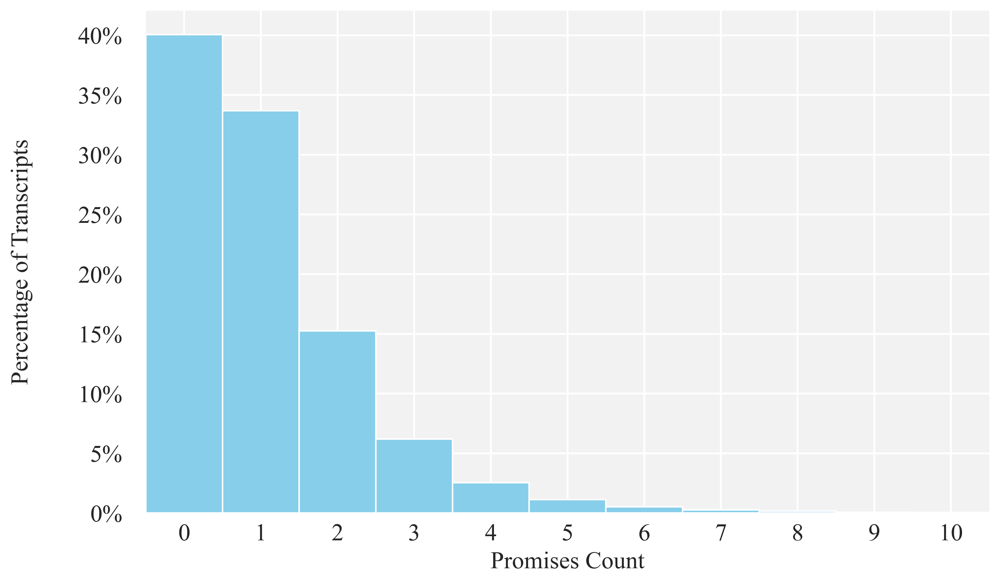

In [42]:
import seaborn as sns
sns.set_style("darkgrid")  # base style with a non-white axes background

# Global look: light grey panel + white gridlines
plt.rcParams['axes.facecolor'] = '#f2f2f2'     # axes (plot area) background
plt.rcParams['figure.facecolor'] = 'white'     # figure background
plt.rcParams['grid.color'] = 'white'           # white gridlines
plt.rcParams['grid.linewidth'] = 1.2
plt.rcParams['axes.edgecolor'] = '#f2f2f2'     # blend spines with background

fig, ax = plt.subplots(figsize=(10, 6), dpi=600)
plt.rcParams['font.family'] = 'Times New Roman'

weights = np.ones_like(df_reg_all_transcripts_select['promise_count']) \
          / len(df_reg_all_transcripts_select['promise_count'])

bins = np.arange(-0.5, 10.6, 1)
ax.hist(df_reg_all_transcripts_select['promise_count'],
        bins=bins, weights=weights, color='skyblue', align='mid')

# Ticks & labels
ax.set_xticks(range(0, 11))
ax.set_xticklabels(range(0, 11), fontname='Times New Roman', fontsize=16)
ax.tick_params(axis='y', labelsize=16, pad=12)  # pad increases space between y-ticks and axis

for label in ax.get_yticklabels():
    label.set_fontname('Times New Roman')

ax.set_xlabel('Promises Count', fontsize=16, fontname='Times New Roman')
ax.set_ylabel('Percentage of Transcripts', fontsize=16, fontname='Times New Roman', labelpad=30)  # labelpad adds space

ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.0%}'.format(x)))
ax.set_xlim([-0.5, 10.5])

# Ensure the grid uses the rcParams (white) and sits above facecolor
ax.grid(True)

# Optional: de-emphasize spines for the soft panel look
for spine in ax.spines.values():
    spine.set_visible(False)

plt.savefig('../data/figures_v3/promises_count_distribution.png', dpi=600, bbox_inches='tight')
plt.show()


In [35]:
df_reg_all_transcripts_select['promise_count'].describe()

count    69167.000000
mean         1.070120
std          1.311567
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         25.000000
Name: promise_count, dtype: float64

In [36]:
# what percent of transcript_id, promise_count is zero?
len(df_reg_all_transcripts_select[df_reg_all_transcripts_select['promise_count']==0]) / len(df_reg_all_transcripts_select)

0.4004944554484075

In [37]:
len(df_reg_all_transcripts_select[df_reg_all_transcripts_select['promise_count']==1]) / len(df_reg_all_transcripts_select)

0.3368947619529544

Number of rows in grouped data: 31
   ceo_tenure  promise_count
0         1.0       1.259577
1         2.0       1.171492
2         3.0       1.141462
3         4.0       1.108108
4         5.0       1.055675


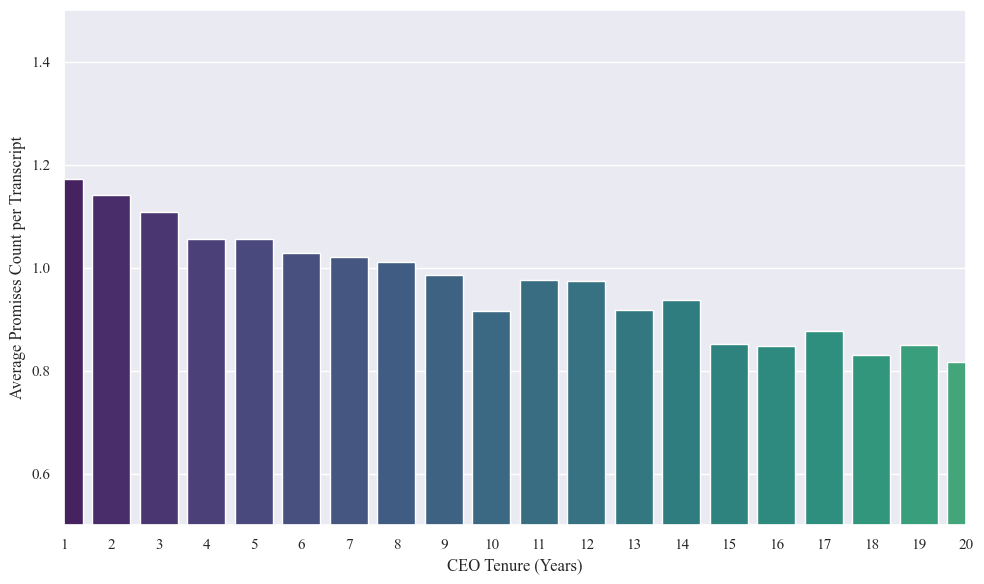

In [38]:
# Set theme
sns.set_theme()

# Set font to Times New Roman for all text elements
plt.rcParams['font.family'] = 'Times New Roman'

# promise_count by ceo_tenure visualization - filter out tenure 0
filtered_df = df_reg_all_transcripts_select[df_reg_all_transcripts_select['ceo_tenure'] > 0]
grouped_df = filtered_df.groupby('ceo_tenure')['promise_count'].mean().reset_index()

# Check if we have data
print(f"Number of rows in grouped data: {len(grouped_df)}")
print(grouped_df.head())

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Barplot using seaborn
sns.barplot(x='ceo_tenure', y='promise_count', data=grouped_df, palette='viridis', ax=ax)

# Set title and labels with Times New Roman font
ax.set_xlabel('CEO Tenure (Years)', fontsize=12, fontfamily='Times New Roman')
ax.set_ylabel('Average Promises Count per Transcript', fontsize=12, fontfamily='Times New Roman')

# Set xlim and ylim to focus on the variation
ax.set_xlim([1, 20])
ax.set_ylim([0.5, 1.5])  # Set y-axis limits to show variation better

# Set x-ticks to integers
integer_ticks = np.arange(1, 21)  # Start from 1 instead of 0
ax.set_xticks(integer_ticks)
ax.set_xticklabels([f"{int(x)}" for x in integer_ticks], fontfamily='Times New Roman')

# Show the plot
plt.tight_layout()
plt.show()

In [39]:
# Create a dataframe with CEOs, their IDs, companies, and median promise counts per company
ceo_company_promises = df_reg_all_transcripts_select_full.groupby(['execid_y', 'gvkey_y']).agg({
    'exec_fullname_y': 'first',
    'companyname_y': 'first',
    'promise_count': 'mean',
    'transcriptid': 'nunique'
}).reset_index()

# The column name after aggregation is 'transcriptid' not 'transcriptid_nunique'
ceo_company_promises['years_in_company'] = ceo_company_promises['transcriptid']

# Flatten the multi-level columns
ceo_company_promises.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in ceo_company_promises.columns]

# Rename columns for clarity
ceo_company_promises = ceo_company_promises.rename(columns={
    'execid_y': 'CEO ID',
    'gvkey_y': 'Company ID',
    'exec_fullname_y': 'CEO Name',
    'companyname_y': 'Company Name',
    'promise_count': 'Median Promise Count',
    'transcriptid': 'Years in Company'
})

# Sort by median promise count in descending order
ceo_company_promises = ceo_company_promises.sort_values('Median Promise Count', ascending=False)

# Display the dataframe
print(f"Number of unique CEO-Company pairs: {len(ceo_company_promises)}")
print(ceo_company_promises[['CEO ID', 'Company ID', 'CEO Name', 'Company Name', 'Median Promise Count', 'Years in Company']].head(10))

Number of unique CEO-Company pairs: 3509
       CEO ID  Company ID               CEO Name                 Company Name  \
668   21241.0      4108.0       Lewis Mark Kling        Flowserve Corporation   
2162  44174.0     64891.0         Stefan Larsson     Ralph Lauren Corporation   
3207  59316.0      3980.0       Robert A. Chapek      The Walt Disney Company   
2250  45235.0     25283.0       Michelle D. Gass           Kohl's Corporation   
1093  28542.0      5071.0      Kendall J. Powell          General Mills, Inc.   
1191  29718.0     13714.0     Robert Marc Bakish             Paramount Global   
1962  41884.0     14309.0             Jean Madar          Inter Parfums, Inc.   
2204  44810.0     16721.0          Andrew Wilson         Electronic Arts Inc.   
191    8749.0      6158.0  A. Malachi Mixon, III         Invacare Corporation   
200    9176.0     11944.0      Brady J. Churches  Tuesday Morning Corporation   

      Median Promise Count  Years in Company  
668               7.

In [40]:
df_reg_all_transcripts_select_full['promise_count'].describe()

count    69167.000000
mean         1.070120
std          1.311567
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         25.000000
Name: promise_count, dtype: float64

In [43]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set Times New Roman font
rcParams['font.family'] = 'Times New Roman'


# Exploration - topic modeling

## Exploring keywords and labels

In [45]:
df.columns

Index(['promise_id', 'primary_keyword', 'transcriptid', 'companyname_x',
       'exec_fullname_y', 'execid_y', 'gvkey_x', 'mostimportantdateutc_x',
       'word_count', 'year_x', '3-promise-horizon-v2', 'Analytic', 'quantity',
       'ceo_tenure', 'ceo_gender_dummy', 'PRisk',
       'trailing_12month_uncertainty_3component', 'uncertainty_ratio',
       'fin_slack_raw', 'functional_background', 'at_log', 'firm_age',
       'numest', 'EPS', 'earnings_surprise_price', 'miss_forecasts',
       'earnings_volatility', 'leverage', 'rd_f', 'n_segments',
       'market_share_sich4', 'strategy_unique', 'mergers',
       'ceo_total_shares_owned_log', 'ceo_dual_dummy', 'positive_ratio',
       'word_count_total_log', 'hhi_sich4_reverse_ind', 'sich4', 'month',
       '3-promise-horizon-clean', 'sich2', 'industry_label'],
      dtype='object')

In [50]:
# List of my select primary keywords
select_primary_keywords = [
    "Expansion Plans",
    "Launch Announcements",
    "Cost Reduction Initiatives",
    "Business Growth",
    "Dividend Policy",
    "Innovation",
    "Construction and Infrastructure Development",
    "Efficiency",
    "Acquisitions",
    "Investment",
    "Business Transformation",
    "Improvement Commitments",
    "Financial and Operational Discipline",
    "Marketing and Advertising Initiatives",
    "Corporate Restructuring",
    "Capacity Expansion",
    "Partnerships",
    "Experience Enhancement",
    "New Facility and Location Openings",
    "Shareholder and Stakeholder Trust and Engagement",
    "Recovery Strategies",
    "Strategic and Operational Implementation",
    "Leadership",
    "Sustainability",
    "Supply Chain Transformation and Resilience",
    "Safety Initiatives",
    "Market Positioning Strategy",
    "Emerging and advanced technologies",
    "Customer Relationship Management",
    "Clean and Renewable Energy Transition",
    "Corporate Strategic Initiatives",
    "Workforce Management and Optimization",
    "Divestitures",
    "Recruitment and Talent Acquisition",
    "Synergy",
    "Continuity",
    "Rebranding Initiatives",
    "Diversification Strategies",
    "Diversity, Equity, and Inclusion",
    "Disclosure Commitments",
    "Education and Training Initiatives",
    "Sustainable Packaging and Recycling",
    "Manufacturing and Production",
    "Omnichannel Strategy"
]

In [51]:
# Get all unique keywords across keyword1, keyword2, and keyword3 columns
labels = pd.read_csv("promises_with_keywords_v5_labels.csv")
all_keywords = set()
for col in ['keyword1', 'keyword2', 'keyword3']:
    # Skip None/NaN values
    keywords = labels[col].dropna().unique()
    all_keywords.update(keywords)

print(f"Total unique keywords across keyword1, keyword2, and keyword3: {len(all_keywords)}")


Total unique keywords across keyword1, keyword2, and keyword3: 56825


In [52]:
# how many unique keyword1 2 3 _label?
all_keywords = set()
for col in ['keyword1_label', 'keyword2_label', 'keyword3_label']:
    # Skip None/NaN values
    keywords = labels[col].dropna().unique()
    all_keywords.update(keywords)

print(f"Total unique keywords across keyword1_label, keyword2_label, and keyword3_label: {len(all_keywords)}")


Total unique keywords across keyword1_label, keyword2_label, and keyword3_label: 118


In [53]:
# Optional: remove extra whitespace from column names
labels.columns = labels.columns.str.strip()

# Create separate DataFrames for each keyword-label pair
df_kw1 = labels[['keyword1', 'keyword1_label']].rename(columns={'keyword1': 'keyword', 'keyword1_label': 'label'})
df_kw2 = labels[['keyword2', 'keyword2_label']].rename(columns={'keyword2': 'keyword', 'keyword2_label': 'label'})
df_kw3 = labels[['keyword3', 'keyword3_label']].rename(columns={'keyword3': 'keyword', 'keyword3_label': 'label'})

# Concatenate into one long DataFrame and drop missing values
df_keywords = pd.concat([df_kw1, df_kw2, df_kw3], ignore_index=True)
df_keywords = df_keywords.dropna(subset=['keyword', 'label'])

# Count occurrences per label-keyword pair
keyword_counts = df_keywords.groupby(['label', 'keyword']).size().reset_index(name='count')

# Calculate overall label frequency
label_counts = df_keywords.groupby('label').size().reset_index(name='total_count')
# Order labels by overall frequency (descending)
label_counts = label_counts.sort_values('total_count', ascending=False)

# Sort keyword counts by label and count descending
keyword_counts_sorted = keyword_counts.sort_values(['label', 'count'], ascending=[True, False])

# Create a dataframe with label, keyword, and count columns
labels_keywords_df = pd.DataFrame()
for _, row in label_counts.iterrows():
    current_label = row['label']
    label_frequency = row['total_count']
    top_keywords = keyword_counts_sorted[keyword_counts_sorted['label'] == current_label].head(100)
    
    # Create temporary dataframe with the current label
    temp_df = top_keywords[['keyword', 'count']].copy()
    temp_df['label'] = current_label
    temp_df['label_frequency'] = label_frequency
    
    # Append to the main dataframe
    labels_keywords_df = pd.concat([labels_keywords_df, temp_df], ignore_index=True)



In [54]:
len(df_keywords[df_keywords['label'] == 'Unclustered'])

72398

In [55]:
labels_keywords_df.to_csv("labels_keywords_df.csv", index=False)

In [56]:
# Import WordCloud library
from wordcloud import WordCloud

# Optional: remove extra whitespace from column names
labels.columns = labels.columns.str.strip()

# Create separate DataFrames for each keyword-label pair
df_kw1 = labels[['keyword1', 'keyword1_label']].rename(columns={'keyword1': 'keyword', 'keyword1_label': 'label'})
df_kw2 = labels[['keyword2', 'keyword2_label']].rename(columns={'keyword2': 'keyword', 'keyword2_label': 'label'})
df_kw3 = labels[['keyword3', 'keyword3_label']].rename(columns={'keyword3': 'keyword', 'keyword3_label': 'label'})

# Concatenate into one long DataFrame and drop missing values
df_keywords = pd.concat([df_kw1, df_kw2, df_kw3], ignore_index=True)
df_keywords = df_keywords.dropna(subset=['keyword', 'label'])

# Remove "Unclustered" label
df_keywords = df_keywords[df_keywords['label'] != 'Unclustered']

# Count occurrences per label-keyword pair
keyword_counts = df_keywords.groupby(['label', 'keyword']).size().reset_index(name='count')

# Calculate overall label frequency
label_counts = df_keywords.groupby('label').size().reset_index(name='total_count')
# Order labels by overall frequency (descending)
label_counts = label_counts.sort_values('total_count', ascending=False)

# Get top 10 clusters by frequency
top_10_clusters = label_counts.head(10)['label'].tolist()

# Create a table for each of the top 10 clusters
for i, cluster in enumerate(top_10_clusters):
    # Get top 10 keywords for this cluster
    top_keywords = keyword_counts[keyword_counts['label'] == cluster].sort_values('count', ascending=False).head(10)
    
    # Get total count for this cluster
    total_count = label_counts[label_counts['label'] == cluster]['total_count'].values[0]
    
    # Display cluster name and total count
    print(f"\n{cluster} (n={total_count})")
    
    # Display table of top keywords
    display(top_keywords[['keyword', 'count']].reset_index(drop=True))

# Create a combined table of top keywords across all clusters
print("\nCombined Top Keywords Across All Top 10 Clusters")

# Prepare data for combined table - ensuring no duplicates
combined_word_freq = {}
for cluster in top_10_clusters:
    top_keywords = keyword_counts[keyword_counts['label'] == cluster].sort_values('count', ascending=False).head(20)
    for _, row in top_keywords.iterrows():
        word = row['keyword']
        count = row['count']
        if word in combined_word_freq:
            combined_word_freq[word] += count
        else:
            combined_word_freq[word] = count

# Convert to DataFrame and sort
combined_df = pd.DataFrame(list(combined_word_freq.items()), columns=['keyword', 'count'])
combined_df = combined_df.sort_values('count', ascending=False).head(20).reset_index(drop=True)



# Create a dataframe with all labels sorted by frequency and top 5 keywords for each
labels_top_keywords = []

for _, row in label_counts.iterrows():
    label = row['label']
    total_count = row['total_count']
    
    # Get top 5 keywords for this label
    top_5_keywords = keyword_counts[keyword_counts['label'] == label].sort_values('count', ascending=False).head(5)['keyword'].tolist()
    
    # Add to results
    labels_top_keywords.append({
        'label': label,
        'frequency': total_count,
        'top_5_keywords': top_5_keywords
    })

# Convert to DataFrame
labels_summary = pd.DataFrame(labels_top_keywords)
#labels_summary.to_csv("labels_summary_v11.csv", index=False)


Expansion Plans (n=11659)


,keyword,count
0,Market Expansion,1650
1,Market Expansion,1119
2,Store Expansion,774
3,International Expansion,448
4,Brand Extension,414
5,Geographic Expansion,409
6,Product Expansion,380
7,International Expansion,363
8,Retail Expansion,317
9,Product Expansion,265



Business Growth (n=6969)


,keyword,count
0,Revenue Growth,832
1,Revenue Growth,426
2,International Growth,359
3,Strategic Growth,343
4,Retail Growth,339
5,Market Growth,301
6,Geographic Growth,278
7,Business Growth,263
8,Sales Growth,247
9,Organic Growth,154



Launch Announcements (n=5893)


,keyword,count
0,Product Launch,4149
1,Product Launch,930
2,Product Release,203
3,Service Launch,40
4,Brand Launch,31
5,Website Launch,30
6,Product Launches,26
7,Program Launch,25
8,Market Launch,25
9,Brand Launch,14



Efficiency (n=5399)


,keyword,count
0,Operational Efficiency,3053
1,Operational Excellence,325
2,Operational Efficiency,312
3,Operational Improvement,251
4,Productivity Improvement,175
5,Cost Management,164
6,Cost Control,154
7,Operational Excellence,150
8,Cost Efficiency,124
9,Capital Efficiency,63



Cost Reduction Initiatives (n=4903)


,keyword,count
0,Cost Reduction,1526
1,Cost Reduction,1186
2,Debt Reduction,488
3,Cost Management,256
4,Debt Reduction,203
5,Expense Management,188
6,Cost Savings,164
7,Cost Control,108
8,Cost Savings,103
9,Inventory Reduction,57



Profitability (n=4262)


,keyword,count
0,Financial Performance,827
1,Margin Improvement,399
2,Profitability Improvement,274
3,Financial Performance,187
4,Profitability,186
5,Earnings Growth,173
6,Profitable Growth,158
7,Earnings Growth,143
8,Margin Improvement,139
9,Financial Strength,131



Return Performance and Targets (n=4155)


,keyword,count
0,Shareholder Returns,1507
1,Capital Return,431
2,Shareholder Return,382
3,Stock Buyback,308
4,Share Repurchase,243
5,Share Repurchases,187
6,Stock Buyback,126
7,Shareholder Returns,116
8,Capital Return,115
9,Return on Investment,61



Innovation (n=3703)


,keyword,count
0,Product Development,641
1,Product Innovation,492
2,Product Innovation,471
3,Innovation,393
4,Product Development,326
5,R&D Investment,280
6,Innovation,200
7,R&D Investment,162
8,Drug Development,151
9,Innovation Pipeline,123



Improvement Commitments (n=3278)


,keyword,count
0,Performance Improvement,419
1,Product Enhancement,231
2,Performance Improvement,172
3,Service Enhancement,157
4,Product Enhancement,128
5,Performance Enhancement,128
6,Continuous Improvement,117
7,Efficiency Improvement,107
8,Process Improvement,91
9,Product Quality,76



Dividend Policy (n=3127)


,keyword,count
0,Dividend Increase,564
1,Dividend Payment,369
2,Share Repurchase,323
3,Cash Distribution,281
4,Dividend Increase,92
5,Dividend Maintenance,88
6,Dividend Growth,85
7,Capital Distribution,77
8,Dividend Growth,65
9,Dividends,64



Combined Top Keywords Across All Top 10 Clusters


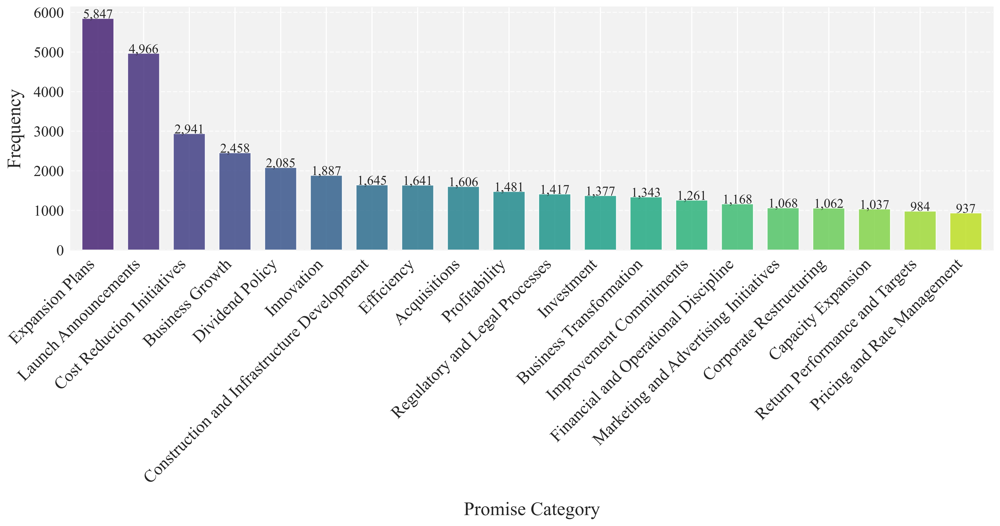

In [48]:
# Plot distribution of primary keywords (excluding "Unclustered")
top_n = 20
plt.figure(figsize=(15, 8), dpi=600)

# Get counts and filter out "Unclustered"
primary_keyword_counts = df["primary_keyword"].value_counts()
primary_keyword_counts = primary_keyword_counts[primary_keyword_counts.index != "Unclustered"]

# Create a colorful palette
colors = plt.cm.viridis(np.linspace(0.1, 0.9, top_n))

# Create bar plot with prettier styling
ax = primary_keyword_counts.head(top_n).plot(
    kind="bar", 
    color=colors,
    edgecolor='white',
    alpha=0.85,
    width=0.7
)

# Add value labels on top of each bar
for i, v in enumerate(primary_keyword_counts.head(top_n)):
    ax.text(i, v + 5, f"{v:,}", ha='center', fontsize=14)

# Customize plot appearance
plt.ylabel("Frequency", fontsize=20, labelpad=10)
plt.xlabel("Promise Category", fontsize=20, labelpad=16)
plt.xticks(rotation=45, ha='right', fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

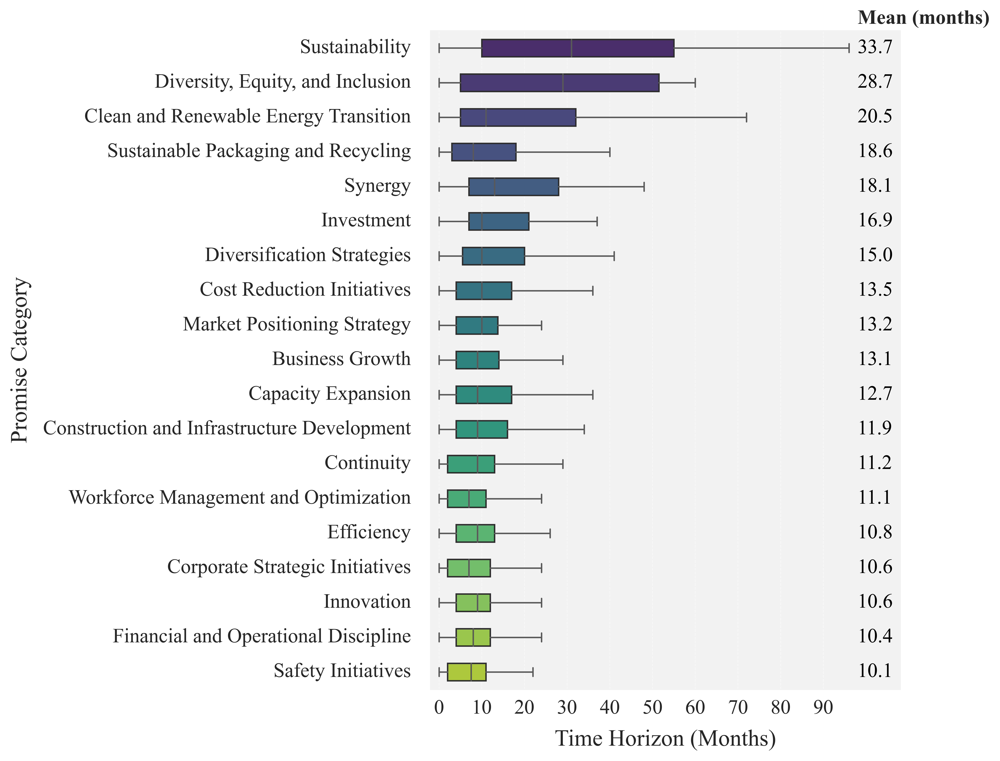

In [82]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Figure ---
plt.figure(figsize=(10, 8), dpi=800)

# --- Filter / prep (same as your snippet) ---
df_horizon = df.dropna(subset=["3-promise-horizon-clean"])
df_horizon = df_horizon[df_horizon["3-promise-horizon-clean"] <= 96]
df_horizon = df_horizon[df_horizon["primary_keyword"] != "Unclustered"]

# Order categories by mean horizon (desc), limited to your selection
mean_horizons = df_horizon.groupby('primary_keyword')["3-promise-horizon-clean"].mean()
df_horizon = df_horizon[df_horizon["primary_keyword"].isin(select_primary_keywords)]
ordered_keywords = mean_horizons.loc[select_primary_keywords].sort_values(ascending=False).index.tolist()[:19]
df_horizon = df_horizon[df_horizon["primary_keyword"].isin(ordered_keywords)]

# Palette (light Viridis)
colors = plt.cm.viridis(np.linspace(0.1, 0.9, len(ordered_keywords)))

# --- Base boxplot (whiskers & quartiles like before; no fliers) ---
ax = sns.boxplot(
    y="primary_keyword",
    x="3-promise-horizon-clean",
    data=df_horizon,
    order=ordered_keywords,
    palette=colors,
    width=0.5,
    fliersize=0,
    linewidth=1.0
)

# --- Add tiny left padding for bars ---
x_min, x_max = ax.get_xlim()
tiny_pad = 2  # 2 months of padding on the left
ax.set_xlim(left=0 - tiny_pad, right=x_max)

# --- Make box faces transparent, keep colored edges (from earlier version) ---
for i, artist in enumerate(ax.artists):
    col = colors[i]
    artist.set_edgecolor(col)
    artist.set_facecolor((col[0], col[1], col[2], 0.0))  # transparent fill
    artist.set_linewidth(1.2)

# Optional: neutral whiskers/caps
for line in ax.lines:
    line.set_color("0.35")
    line.set_linewidth(1.0)

# --- Compute MEANS for the right-side column ---
means = (
    df_horizon.groupby("primary_keyword")["3-promise-horizon-clean"]
              .mean()
              .loc[ordered_keywords]
)
ypos = np.arange(len(ordered_keywords))

# --- Right-side mean labels ---
X_MAX = 96
pad_for_labels = 12
label_x = X_MAX + 2    # where the mean values will sit

top_pad = 0.7  # increase for more padding
ax.text(label_x, -top_pad, "Mean (months)", fontsize=14, weight='bold')
for y, m in zip(ypos, means.values):
    ax.text(label_x, y, f"{m:.1f}", va='center', ha='left', fontsize=14, color="black")

# --- Ticks and grids every 10 months ---
tick_vals = np.arange(0, X_MAX + 1, 10)
ax.set_xticks(tick_vals)
ax.set_xlim(left=0 - tiny_pad, right=X_MAX + pad_for_labels)  # extend to fit right column and left pad
ax.grid(axis='x', which='major', linestyle='--', alpha=0.5, linewidth=0.5)

# --- Labels and aesthetics ---
ax.set_xlabel("Time Horizon (Months)", fontsize=16, labelpad=8)
ax.set_ylabel("Promise Category", fontsize=16, labelpad=8)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14, va='center', rotation=0)
ax.tick_params(axis='y', pad=10)
ax.tick_params(axis='x', labelsize=14)  # small x-axis labels

plt.tight_layout(pad=2.0)
plt.show()


In [63]:
# Average promise horizon by keyword
df_filtered = df[df['primary_keyword'] != 'Unclustered']
avg_horizon = df_filtered.groupby('primary_keyword')['3-promise-horizon-clean'].agg(['mean', 'median', 'std', 'count']).dropna()

# Sort by mean horizon in descending order
avg_horizon = avg_horizon.sort_values('mean', ascending=False)

print("\nAverage promise horizon by primary keyword:")
print(avg_horizon)

# Save to CSV
avg_horizon.reset_index().to_csv('../data/primary_keyword_avg_horizons.csv', index=False)
print(f"Saved primary keyword average horizons to '../data/primary_keyword_avg_horizons.csv'")



Average promise horizon by primary keyword:
                                             mean  median         std  count
primary_keyword                                                             
Sustainability                         117.313924   100.0  109.334664    395
Commitments                             58.747126    10.5  148.517274    174
Clean and Renewable Energy Transition   49.589404    17.0   77.114427    302
Diversity, Equity, and Inclusion        38.774194    36.0   36.651155     93
Electric Mobility and Electrification   32.848485    17.0   41.002530     66
...                                           ...     ...         ...    ...
Seasonal Business Strategy               4.052632     2.0    4.775013     57
Reporting Enhancements                   3.960526     2.0    6.520352    152
Disclosure Commitments                   3.500000     2.0    6.162558    154
Industry Conferences and Events          2.643725     1.0    3.660739    247
Investor Relations Events      

In [49]:
# Get frequency of each primary keyword
keyword_counts = df['primary_keyword'].value_counts().reset_index()
keyword_counts.columns = ['primary_keyword', 'frequency']

# Sort by frequency in descending order
keyword_counts = keyword_counts.sort_values('frequency', ascending=False)

# Save to CSV
keyword_counts.to_csv('../data/primary_keyword_frequencies.csv', index=False)

print(f"Saved primary keyword frequencies to '../data/primary_keyword_frequencies.csv'")

Saved primary keyword frequencies to '../data/primary_keyword_frequencies.csv'


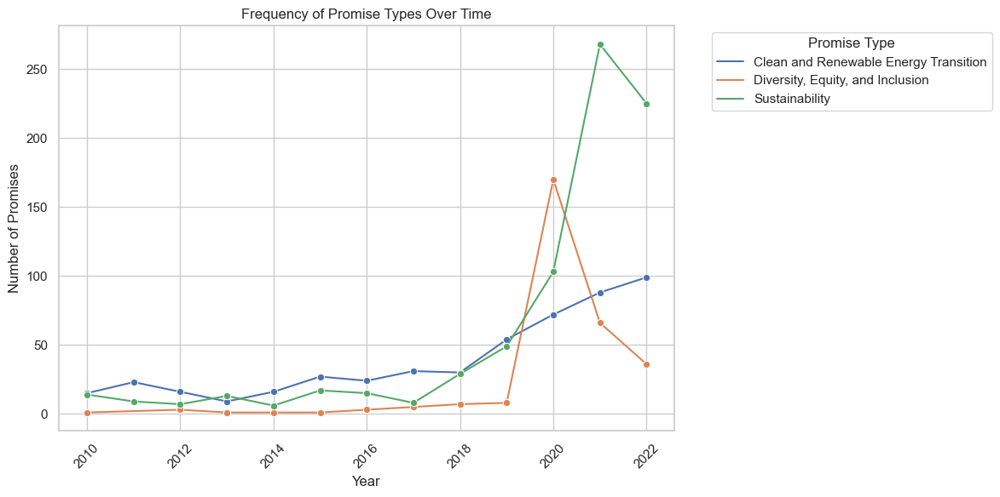

In [186]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your dataframe with the promises data
# Filter for the three specific labels
labels_of_interest = [
    'Sustainability',
    'Clean and Renewable Energy Transition',
    'Diversity, Equity, and Inclusion'
]

# Group by year and label, count occurrences
promises_by_year = df[df['primary_keyword'].isin(labels_of_interest)].groupby(
    ['year_x', 'primary_keyword'])['promise_id'].count().reset_index()

# Create the line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=promises_by_year, 
            x='year_x', 
            y='promise_id',
            hue='primary_keyword',
            marker='o')

plt.title('Frequency of Promise Types Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Promises')
plt.xticks(rotation=45)
plt.legend(title='Promise Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Functional Background Distribution:
functional_background
Operations/Supply Chain                   12080
Finance/Accounting                         4752
Sales/Marketing                            2205
Technology/Product/Engineering/Science      838
Strategy                                    771
Legal/Compliance/Regulatory/Risk            555
Administrative                              184
Human Resources                              33
Name: count, dtype: int64


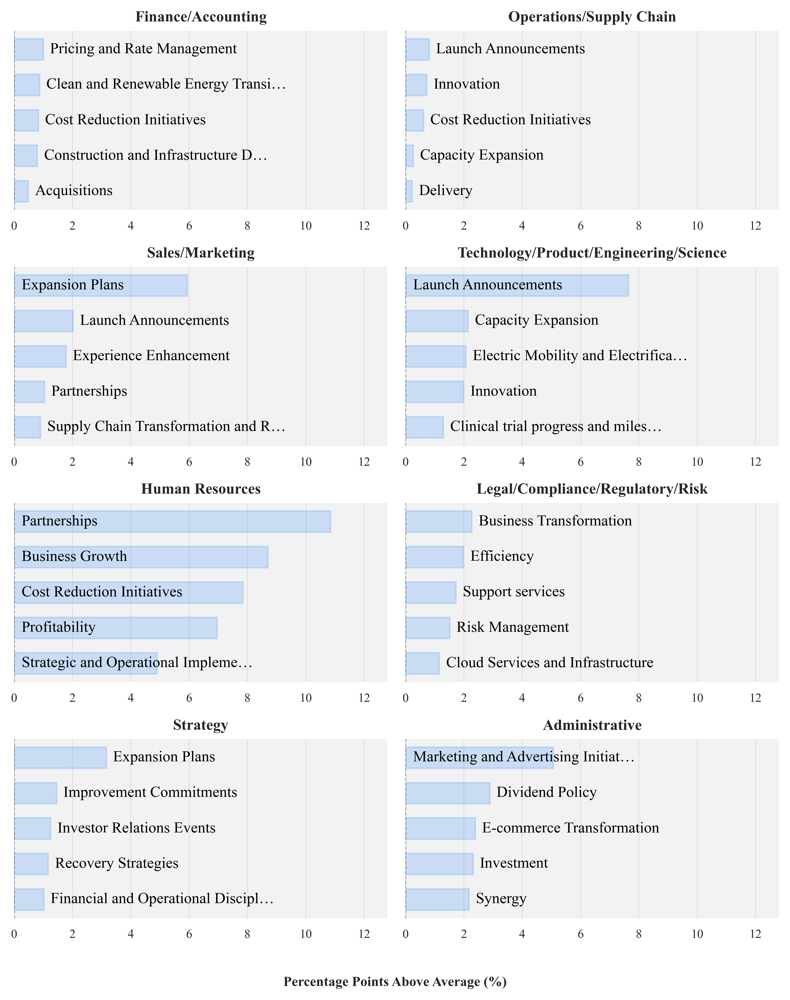


Promise counts by functional background:
functional_background
Operations/Supply Chain                   12080
Finance/Accounting                         4752
Sales/Marketing                            2205
Technology/Product/Engineering/Science      838
Strategy                                    771
Legal/Compliance/Regulatory/Risk            555
Administrative                              184
Human Resources                              33
dtype: int64

Percentages by Functional Background:
primary_keyword                         Acceleration Initiatives  \
functional_background                                              
Administrative                                              0.00   
Finance/Accounting                                          0.21   
Human Resources                                             0.00   
Legal/Compliance/Regulatory/Risk                            0.00   
Operations/Supply Chain                                     0.12   
Sales/Marketing         

In [98]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# -------------------- PREP (unchanged from your cell) --------------------
plt.rcParams['figure.dpi'] = 600
plt.rcParams['pdf.fonttype'] = 42   # embed TrueType
plt.rcParams['ps.fonttype'] = 42

# Filter
df_filtered = df[(df['primary_keyword'] != 'Unclustered') &
                 (df['functional_background'] != 'Other/Unclear')]

print("Functional Background Distribution:")
print(df_filtered['functional_background'].value_counts())

# Differences from overall average (pct-point over/under)
cross_tab = pd.crosstab(df_filtered['functional_background'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
overall_percentages = df_filtered['primary_keyword'].value_counts() / len(df_filtered) * 100

differences_from_avg = {}
for background in cross_tab_pct.index:
    diff = cross_tab_pct.loc[background] - overall_percentages
    differences_from_avg[background] = diff.sort_values(ascending=False)

# Fixed order; keep only those present
ordered_backgrounds = [
    'Finance/Accounting',
    'Operations/Supply Chain',
    'Sales/Marketing',
    'Technology/Product/Engineering/Science',
    'Human Resources',
    'Legal/Compliance/Regulatory/Risk',
    'Strategy',
    'Administrative'
]
ordered_backgrounds = [bg for bg in ordered_backgrounds if bg in differences_from_avg]

# -------------------- PLOT SETTINGS --------------------
TOP_N = 5  # changed from 3 to 5
BAR_COLOR   = "#60A5FA"   # pick one above
BAR_ALPHA   = 0.26        # keep translucent for on-bar text
EDGE_COLOR  = "#1D4ED8"   # darker outline for print # light-ish blue base
BAR_ALPHA = 0.28        # transparency so text reads clearly
TITLE_FONTSIZE = 10
AXIS_FONTSIZE  = 8
LABEL_FONTSIZE = 10

# Global max for a consistent x-scale across all panels
all_vals = []
for bg in ordered_backgrounds:
    s = differences_from_avg[bg]
    s_pos = s[s > 0].head(TOP_N)
    all_vals.extend(s_pos.values)
xmax = max(all_vals) if len(all_vals) else 1.0
xmax = xmax * 1.18  # room for value labels on the right

# Offset and threshold for placing labels
RIGHT_OFFSET = 0.018 * xmax           # gap to the right of bars
INSIDE_THRESHOLD = 0.35 * xmax        # bars shorter than this get label outside

def ellipsize(s, max_chars=34):
    s = str(s)
    return s if len(s) <= max_chars else (s[:max_chars-1] + "…")

# -------------------- FIGURE --------------------
# 7.2x9.2 inches is a good full-page footprint for many journals
fig, axes = plt.subplots(4, 2, figsize=(7.2, 9.2))
axes = axes.flatten()

for i, background in enumerate(ordered_backgrounds):
    s = differences_from_avg[background]
    s_pos = s[s > 0].head(TOP_N)  # only Top-5 positive

    ax = axes[i]
    if s_pos.empty:
        ax.axis("off")
        continue

    y = np.arange(len(s_pos))
    # Bars
    bars = ax.barh(
        y,
        s_pos.values,
        height=0.6,
        color=BAR_COLOR,
        alpha=BAR_ALPHA,
        edgecolor=BAR_COLOR,
        linewidth=1.0
    )

    # Axis styling
    ax.set_xlim(0, xmax)
    ax.set_yticks([])  # we move labels onto bars
    ax.set_title(background, fontsize=TITLE_FONTSIZE, fontweight='bold', pad=6)
    ax.xaxis.grid(True, which='major', color='#DDDD', linewidth=0.5)
    ax.axvline(0, color='black', linestyle='--', linewidth=0.6, alpha=0.5)
    ax.tick_params(axis='x', labelsize=AXIS_FONTSIZE)
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Labels: keyword on the bar if it fits; else just outside on the right.
    for j, (kw, v) in enumerate(zip(s_pos.index, s_pos.values)):
        kw_text = ellipsize(kw, max_chars=34)

        # Place keyword text
        if v >= INSIDE_THRESHOLD:
            x_text = 0.02 * xmax  # inside, near the left edge of the bar
        else:
            x_text = v + RIGHT_OFFSET  # just outside the bar on the right

        ax.text(
            x_text, j, kw_text,
            ha='left', va='center',
            fontsize=LABEL_FONTSIZE,
            color='black'
        )

    # Largest at top
    ax.invert_yaxis()

# Remove unused axes if any
for k in range(len(ordered_backgrounds), 8):
    fig.delaxes(axes[k])

# Common x label
fig.text(0.5, 0.01, 'Percentage Points Above Average (%)',
         ha='center', fontsize=9, fontweight='bold')

plt.tight_layout(rect=[0, 0.04, 1, 0.98])
plt.show()

# -------------------- (optional) diagnostics you already print --------------------
print("\nPromise counts by functional background:")
print(df_filtered.groupby('functional_background').size().sort_values(ascending=False))

cross_tab = pd.crosstab(df_filtered['functional_background'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
print("\nPercentages by Functional Background:")
print(cross_tab_pct.round(2))

print("\nMost distinctive keywords by functional background (largest differences from average):")
for background in ordered_backgrounds:
    print(f"\n{background}:")
    diff = differences_from_avg[background]
    print("Top 10 overrepresented:")
    print(diff.head(10))
    print("\nTop 10 underrepresented:")
    print(diff.tail(10))


In [169]:

# Print statistics
print("\nDetailed Statistics by Functional Background:")
stats = df_reg_all_transcripts_select.groupby('functional_background').agg({
    'promise_count': ['count', 'mean', 'std', 'min', 'max', 'median'],
    'execid': 'nunique'
}).round(2)
stats.columns = ['Number of Transcripts', 'Mean Promises/Transcript', 'Std Dev', 'Min', 'Max', 'Median', 'Number of CEOs']
print(stats.sort_values(('Mean Promises/Transcript'), ascending=False))


Detailed Statistics by Functional Background:
                                        Number of Transcripts   
functional_background                                           
Sales/Marketing                                          1696  \
Strategy                                                  646   
Technology/Product/Engineering/Science                    774   
Operations/Supply Chain                                 11594   
Administrative                                            188   
Finance/Accounting                                       4791   
Legal/Compliance/Regulatory/Risk                          566   
Other/Unclear                                           12472   
Human Resources                                            42   

                                        Mean Promises/Transcript  Std Dev   
functional_background                                                       
Sales/Marketing                                             1.36     1.67  \
Strate

In [126]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Filter out unclustered
df_filtered = df[df['primary_keyword'] != 'Unclustered']

# Calculate industry-level R&D intensity
industry_rd = df.groupby('sich4')['rd_f'].mean().reset_index()
industry_rd = industry_rd.rename(columns={'rd_f': 'industry_rd_intensity'})

# Merge back to main dataframe
df_with_ind_rd = df.merge(industry_rd, on='sich4', how='left')

# Get top keywords from previous analysis
top_keywords = df_filtered['primary_keyword'].value_counts().head(10).index

# Create bins for R&D intensity for smoother visualization
df_with_ind_rd['rd_bins'] = pd.qcut(df_with_ind_rd['industry_rd_intensity'], 
                                   q=20,  # 20 bins for smooth curve
                                   duplicates='drop')

# Calculate percentage for each keyword within each bin
keyword_by_rd = pd.DataFrame()
for keyword in top_keywords:
    # Calculate percentage of this keyword in each R&D bin
    keyword_pct = df_with_ind_rd[df_with_ind_rd['primary_keyword'] == keyword].groupby('rd_bins').size()
    total_in_bin = df_with_ind_rd.groupby('rd_bins').size()
    pct_series = (keyword_pct / total_in_bin * 100)
    keyword_by_rd[keyword] = pct_series

# Get the middle point of each R&D bin for x-axis
rd_mid_points = df_with_ind_rd.groupby('rd_bins')['industry_rd_intensity'].mean()

# Create the plot
plt.figure(figsize=(15, 10))

# Plot line for each keyword
for keyword in top_keywords:
    plt.plot(rd_mid_points, keyword_by_rd[keyword], marker='o', label=keyword, linewidth=2, markersize=6)

plt.xlabel('Industry R&D Intensity', fontsize=12)
plt.ylabel('Percentage of Promises (%)', fontsize=12)
plt.title('Promise Topics by Industry R&D Intensity', fontsize=14, pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.grid(True, alpha=0.3)

# Add log scale for x-axis since R&D intensity might be right-skewed
plt.xscale('log')

plt.tight_layout()
plt.show()

# Create separate plots for better visibility
n_cols = 2
n_rows = (len(top_keywords) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()

for idx, keyword in enumerate(top_keywords):
    sns.regplot(x=rd_mid_points, y=keyword_by_rd[keyword], 
                ax=axes[idx], scatter_kws={'alpha':0.5}, line_kws={'color': 'red'})
    axes[idx].set_title(keyword)
    axes[idx].set_xlabel('Industry R&D Intensity (log scale)')
    axes[idx].set_ylabel('Percentage of Promises (%)')
    axes[idx].set_xscale('log')
    axes[idx].grid(True, alpha=0.3)

# Remove empty subplots if any
for idx in range(len(top_keywords), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print correlation statistics
correlations = {}
for keyword in top_keywords:
    corr = np.corrcoef(rd_mid_points, keyword_by_rd[keyword])[0,1]
    correlations[keyword] = corr

print("\nCorrelations between R&D intensity and keyword prevalence:")
for keyword, corr in sorted(correlations.items(), key=lambda x: abs(x[1]), reverse=True):
    print(f"{keyword}: {corr:.3f}")


Correlations between R&D intensity and keyword prevalence:
Efficiency: -0.732
Cost Reduction Initiatives: -0.683
Launch Announcements: 0.643
Innovation: 0.632
Dividend Policy: -0.622
Expansion Plans: -0.591
Construction and Infrastructure Development: -0.406
Profitability: -0.245
Acquisitions: -0.216
Business Growth: 0.131


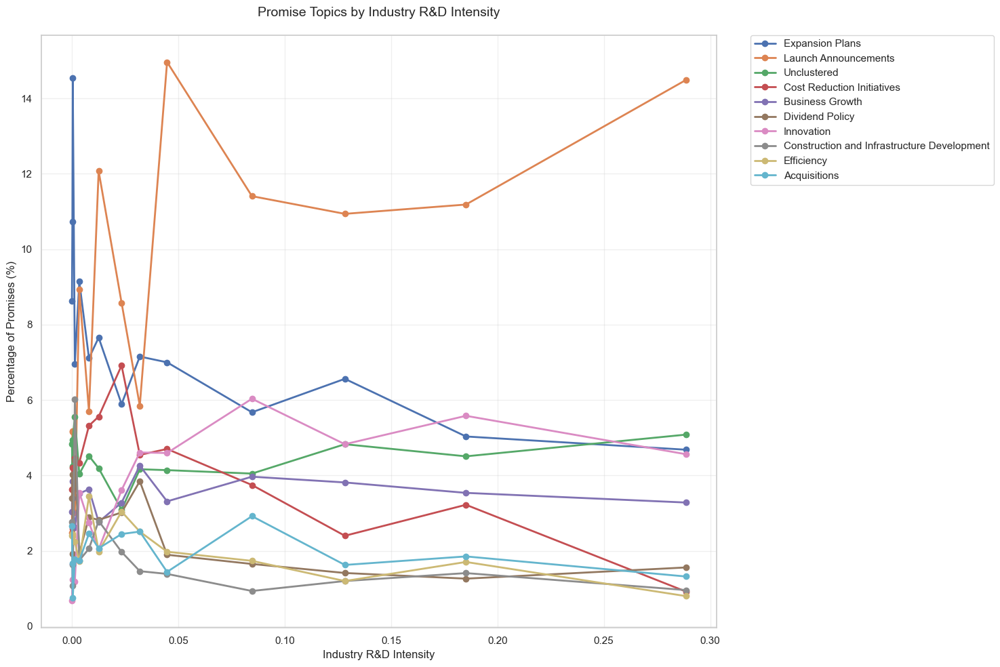

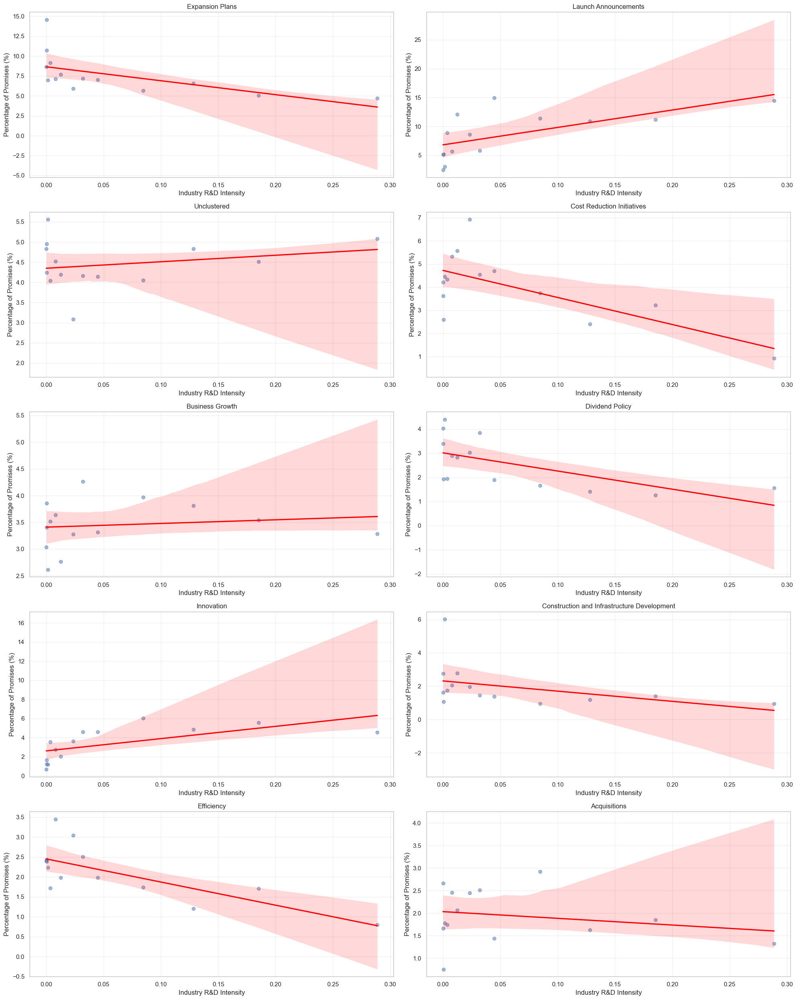


Correlations between R&D intensity and keyword prevalence:
Efficiency: -0.732
Cost Reduction Initiatives: -0.683
Launch Announcements: 0.643
Innovation: 0.632
Dividend Policy: -0.622
Expansion Plans: -0.591
Construction and Infrastructure Development: -0.406
Unclustered: 0.234
Acquisitions: -0.216
Business Growth: 0.131


In [176]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Filter out unclustered
df_filtered = df[df['primary_keyword'] != 'unclustered']

# Calculate industry-level R&D intensity
industry_rd = df.groupby('sich4')['rd_f'].mean().reset_index()
industry_rd = industry_rd.rename(columns={'rd_f': 'industry_rd_intensity'})

# Merge back to main dataframe
df_with_ind_rd = df.merge(industry_rd, on='sich4', how='left')

# Get top keywords from previous analysis
top_keywords = df_filtered['primary_keyword'].value_counts().head(10).index

# Create bins for R&D intensity for smoother visualization
df_with_ind_rd['rd_bins'] = pd.qcut(df_with_ind_rd['industry_rd_intensity'], 
                                   q=20,  # 20 bins for smooth curve
                                   duplicates='drop')

# Calculate percentage for each keyword within each bin
keyword_by_rd = pd.DataFrame()
for keyword in top_keywords:
    # Calculate percentage of this keyword in each R&D bin
    keyword_pct = df_with_ind_rd[df_with_ind_rd['primary_keyword'] == keyword].groupby('rd_bins').size()
    total_in_bin = df_with_ind_rd.groupby('rd_bins').size()
    pct_series = (keyword_pct / total_in_bin * 100)
    keyword_by_rd[keyword] = pct_series

# Get the middle point of each R&D bin for x-axis
rd_mid_points = df_with_ind_rd.groupby('rd_bins')['industry_rd_intensity'].mean()

# Create the plot
plt.figure(figsize=(15, 10))

# Plot line for each keyword
for keyword in top_keywords:
    plt.plot(rd_mid_points, keyword_by_rd[keyword], marker='o', label=keyword, linewidth=2, markersize=6)

plt.xlabel('Industry R&D Intensity', fontsize=12)
plt.ylabel('Percentage of Promises (%)', fontsize=12)
plt.title('Promise Topics by Industry R&D Intensity', fontsize=14, pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Create separate plots for better visibility
n_cols = 2
n_rows = (len(top_keywords) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()

for idx, keyword in enumerate(top_keywords):
    sns.regplot(x=rd_mid_points, y=keyword_by_rd[keyword], 
                ax=axes[idx], scatter_kws={'alpha':0.5}, line_kws={'color': 'red'})
    axes[idx].set_title(keyword)
    axes[idx].set_xlabel('Industry R&D Intensity')
    axes[idx].set_ylabel('Percentage of Promises (%)')
    axes[idx].grid(True, alpha=0.3)

# Remove empty subplots if any
for idx in range(len(top_keywords), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print correlation statistics
correlations = {}
for keyword in top_keywords:
    corr = np.corrcoef(rd_mid_points, keyword_by_rd[keyword])[0,1]
    correlations[keyword] = corr

print("\nCorrelations between R&D intensity and keyword prevalence:")
for keyword, corr in sorted(correlations.items(), key=lambda x: abs(x[1]), reverse=True):
    print(f"{keyword}: {corr:.3f}")

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_40491/3827306214.py:28: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_40491/3827306214.py:28: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_40491/3827306214.py:28: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

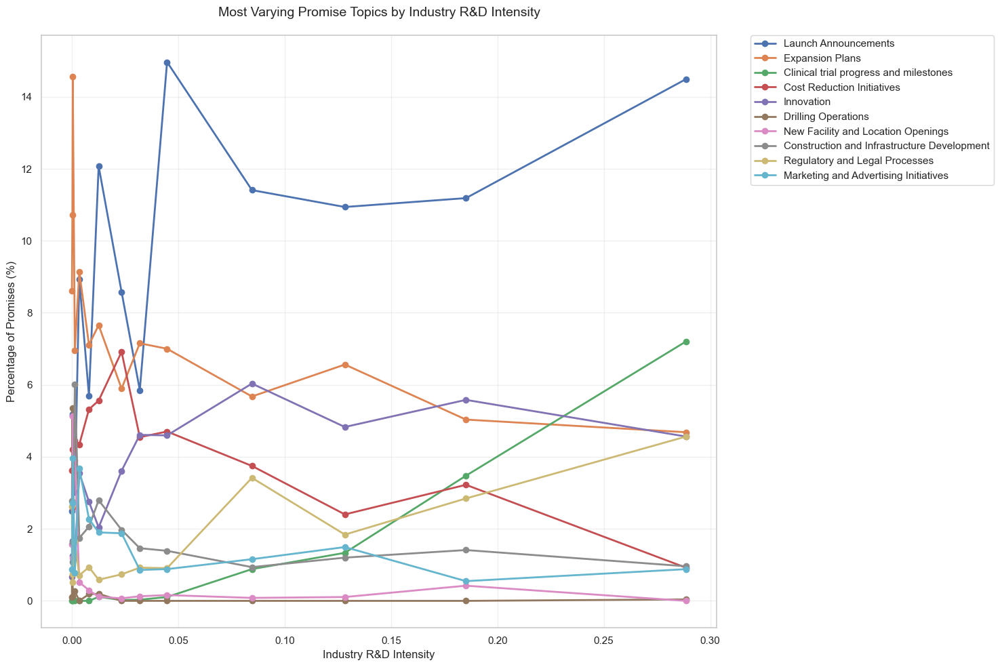

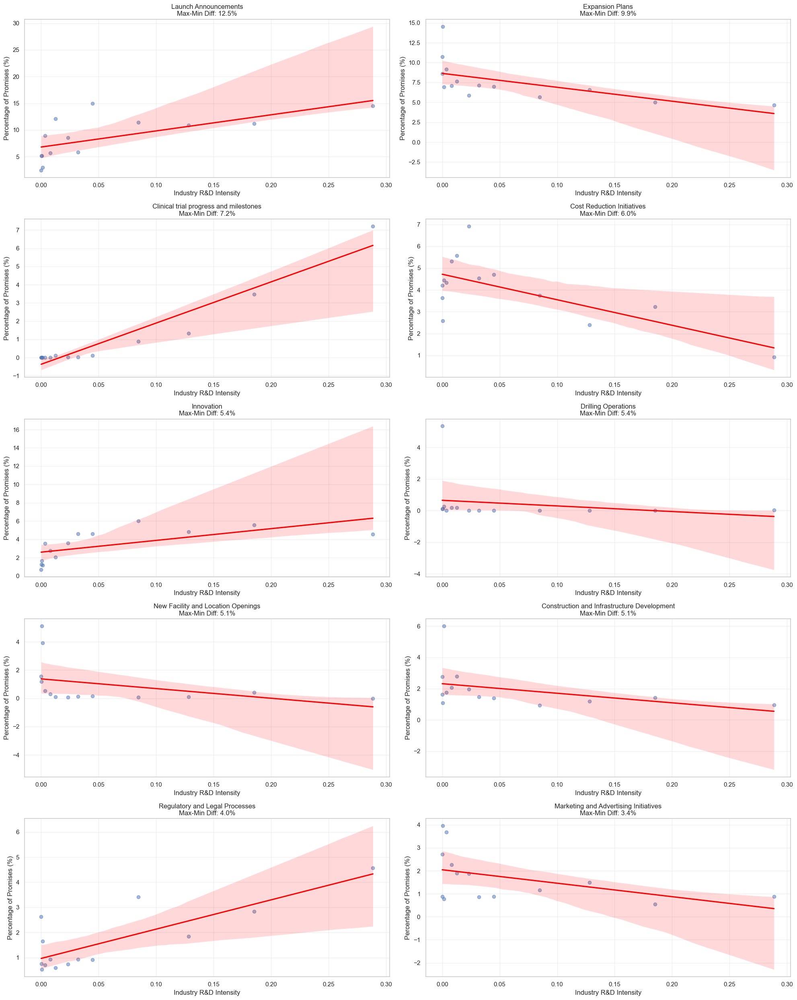


Top varying keywords statistics:

Launch Announcements:
  Mean: 8.57%
  Std Dev: 4.07
  Max-Min Difference: 12.48%
  Coefficient of Variation: 0.48

Expansion Plans:
  Mean: 7.63%
  Std Dev: 2.56
  Max-Min Difference: 9.87%
  Coefficient of Variation: 0.34

Clinical trial progress and milestones:
  Mean: 0.94%
  Std Dev: 2.04
  Max-Min Difference: 7.21%
  Coefficient of Variation: 2.17

Cost Reduction Initiatives:
  Mean: 4.04%
  Std Dev: 1.48
  Max-Min Difference: 6.00%
  Coefficient of Variation: 0.37

Innovation:
  Mean: 3.35%
  Std Dev: 1.76
  Max-Min Difference: 5.36%
  Coefficient of Variation: 0.53

Drilling Operations:
  Mean: 0.45%
  Std Dev: 1.41
  Max-Min Difference: 5.35%
  Coefficient of Variation: 3.16

New Facility and Location Openings:
  Mean: 0.98%
  Std Dev: 1.58
  Max-Min Difference: 5.12%
  Coefficient of Variation: 1.62

Construction and Infrastructure Development:
  Mean: 1.96%
  Std Dev: 1.31
  Max-Min Difference: 5.08%
  Coefficient of Variation: 0.67

Regulat

In [177]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Filter out unclustered
df_filtered = df[df['primary_keyword'] != 'Unclustered']

# Calculate industry-level R&D intensity
industry_rd = df.groupby('sich4')['rd_f'].mean().reset_index()
industry_rd = industry_rd.rename(columns={'rd_f': 'industry_rd_intensity'})

# Merge back to main dataframe
df_with_ind_rd = df.merge(industry_rd, on='sich4', how='left')

# Create bins for R&D intensity
df_with_ind_rd['rd_bins'] = pd.qcut(df_with_ind_rd['industry_rd_intensity'], 
                                   q=20,  # 20 bins for smooth curve
                                   duplicates='drop')

# Calculate percentage for each keyword within each bin
all_keywords = df_filtered['primary_keyword'].unique()
keyword_by_rd = pd.DataFrame()
for keyword in all_keywords:
    keyword_pct = df_with_ind_rd[df_with_ind_rd['primary_keyword'] == keyword].groupby('rd_bins').size()
    total_in_bin = df_with_ind_rd.groupby('rd_bins').size()
    pct_series = (keyword_pct / total_in_bin * 100)
    keyword_by_rd[keyword] = pct_series

# Get the middle point of each R&D bin for x-axis
rd_mid_points = df_with_ind_rd.groupby('rd_bins')['industry_rd_intensity'].mean()

# Calculate variation metrics for each keyword
keyword_stats = {}
for keyword in all_keywords:
    # Calculate various metrics of change
    std_dev = keyword_by_rd[keyword].std()
    max_min_diff = keyword_by_rd[keyword].max() - keyword_by_rd[keyword].min()
    mean_val = keyword_by_rd[keyword].mean()
    coef_var = std_dev / mean_val if mean_val > 0 else 0
    
    keyword_stats[keyword] = {
        'std_dev': std_dev,
        'max_min_diff': max_min_diff,
        'mean': mean_val,
        'coef_var': coef_var
    }

# Sort keywords by max-min difference to find those with biggest changes
keyword_variation = pd.DataFrame(keyword_stats).T
top_varying_keywords = keyword_variation.nlargest(10, 'max_min_diff').index

# Create plots for top varying keywords
plt.figure(figsize=(15, 10))

# Plot line for each keyword
for keyword in top_varying_keywords:
    plt.plot(rd_mid_points, keyword_by_rd[keyword], marker='o', label=keyword, linewidth=2, markersize=6)

plt.xlabel('Industry R&D Intensity', fontsize=12)
plt.ylabel('Percentage of Promises (%)', fontsize=12)
plt.title('Most Varying Promise Topics by Industry R&D Intensity', fontsize=14, pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Create separate plots for better visibility
n_cols = 2
n_rows = (len(top_varying_keywords) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()

for idx, keyword in enumerate(top_varying_keywords):
    sns.regplot(x=rd_mid_points, y=keyword_by_rd[keyword], 
                ax=axes[idx], scatter_kws={'alpha':0.5}, line_kws={'color': 'red'})
    axes[idx].set_title(f"{keyword}\nMax-Min Diff: {keyword_stats[keyword]['max_min_diff']:.1f}%")
    axes[idx].set_xlabel('Industry R&D Intensity')
    axes[idx].set_ylabel('Percentage of Promises (%)')
    axes[idx].grid(True, alpha=0.3)

# Remove empty subplots if any
for idx in range(len(top_varying_keywords), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print statistics for top varying keywords
print("\nTop varying keywords statistics:")
for keyword in top_varying_keywords:
    stats = keyword_stats[keyword]
    print(f"\n{keyword}:")
    print(f"  Mean: {stats['mean']:.2f}%")
    print(f"  Std Dev: {stats['std_dev']:.2f}")
    print(f"  Max-Min Difference: {stats['max_min_diff']:.2f}%")
    print(f"  Coefficient of Variation: {stats['coef_var']:.2f}")

# Calculate correlations for top varying keywords
correlations = {}
for keyword in top_varying_keywords:
    corr = np.corrcoef(rd_mid_points, keyword_by_rd[keyword])[0,1]
    correlations[keyword] = corr

print("\nCorrelations with R&D intensity:")
for keyword, corr in sorted(correlations.items(), key=lambda x: abs(x[1]), reverse=True):
    print(f"{keyword}: {corr:.3f}")

Industry Distribution:
industry_label
Manufacturing                        28939
Finance, Insurance, Real Estate      11293
Services                              9860
Transportation & Public Utilities     7007
Retail Trade                          6844
Mining                                3240
Wholesale Trade                       2052
Construction                           863
nan                                    467
Public Administration                   87
Name: count, dtype: int64


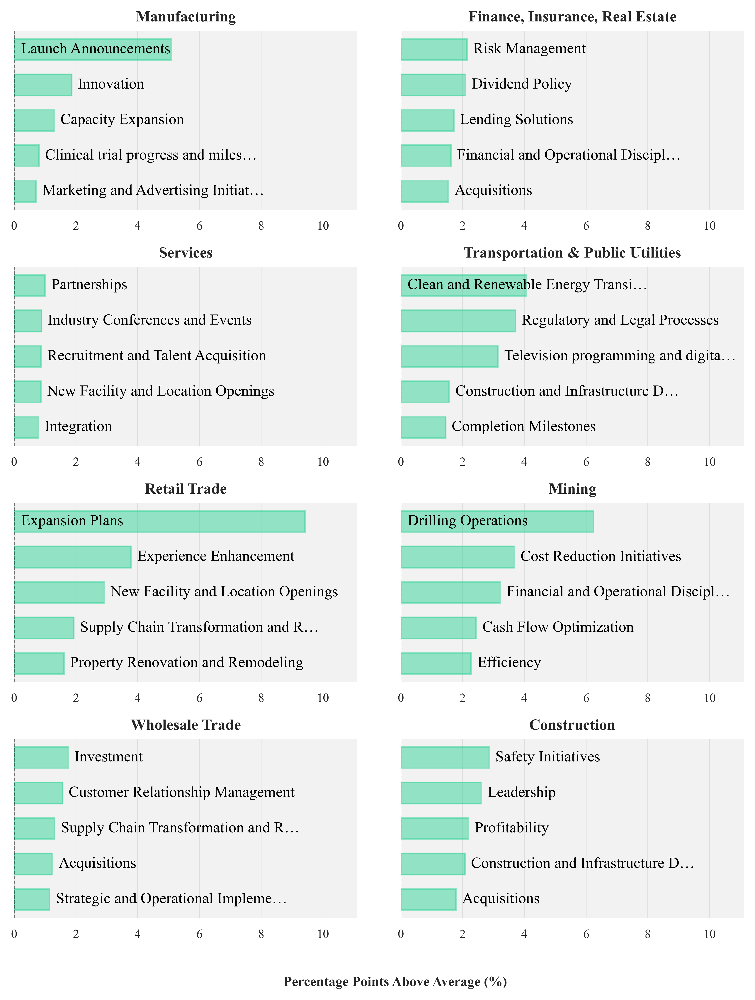


Promise counts by industry:
industry_label
Manufacturing                        28939
Finance, Insurance, Real Estate      11293
Services                              9860
Transportation & Public Utilities     7007
Retail Trade                          6844
Mining                                3240
Wholesale Trade                       2052
Construction                           863
nan                                    467
Public Administration                   87
dtype: int64

Percentages by Industry:
primary_keyword                    Acceleration Initiatives  Acquisitions  \
industry_label                                                              
Construction                                           0.23          4.06   
Finance, Insurance, Real Estate                        0.14          3.81   
Manufacturing                                          0.16          1.92   
Mining                                                 0.46          1.30   
Public Administration    

In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- FILTER & STATS --------------------
plt.rcParams['figure.dpi'] = 600
plt.rcParams['pdf.fonttype'] = 42   # embed TrueType fonts
plt.rcParams['ps.fonttype'] = 42

# Keep rows with an industry and not Unclustered
df_filtered = df[(df['primary_keyword'] != 'Unclustered') &
                 (df['industry_label'].notna())].copy()

print("Industry Distribution:")
print(df_filtered['industry_label'].value_counts())

# Differences from overall average (pct points over/under)
cross_tab = pd.crosstab(df_filtered['industry_label'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
overall_percentages = df_filtered['primary_keyword'].value_counts() / len(df_filtered) * 100

differences_from_avg = {}
for industry in cross_tab_pct.index:
    diff = cross_tab_pct.loc[industry] - overall_percentages
    differences_from_avg[industry] = diff.sort_values(ascending=False)

# -------------------- WHICH INDUSTRIES TO SHOW (max 8) --------------------
MAX_PANELS = 8
# Option 1 (default): top industries by sample size
ordered_industries = df_filtered['industry_label'].value_counts().index.tolist()[:MAX_PANELS]

# Option 2: override with a manual list (uncomment and edit)
# INDUSTRIES_TO_PLOT = ['Technology', 'Healthcare', 'Financials', 'Consumer Discretionary',
#                       'Industrials', 'Energy', 'Utilities', 'Materials']
# ordered_industries = [i for i in INDUSTRIES_TO_PLOT if i in differences_from_avg][:MAX_PANELS]

# -------------------- VISUAL SETTINGS --------------------
TOP_N = 5
BAR_COLOR  = "#34D399"   
BAR_ALPHA  = 0.26
EDGE_COLOR = "#047857"    # lighter green
BAR_ALPHA = 0.5           # a bit more visible but still light
TITLE_FONTSIZE = 10
AXIS_FONTSIZE  = 8
LABEL_FONTSIZE = 10

def ellipsize(s, max_chars=34):
    s = str(s)
    return s if len(s) <= max_chars else (s[:max_chars-1] + "…")

# Global x‑limit for consistent scale
all_vals = []
for ind in ordered_industries:
    s = differences_from_avg[ind]
    s_pos = s[s > 0].head(TOP_N)
    all_vals.extend(s_pos.values)
xmax = max(all_vals) if all_vals else 1.0
xmax = xmax * 1.18  # room for value labels

RIGHT_OFFSET = 0.018 * xmax         # gap from bar tip to first outside label
INSIDE_THRESHOLD = 0.35 * xmax      # bars shorter than this put keyword outside

# -------------------- FIGURE --------------------
fig, axes = plt.subplots(4, 2, figsize=(7.2, 9.2))
axes = axes.flatten()

for i, industry in enumerate(ordered_industries):
    ax = axes[i]
    s = differences_from_avg[industry]
    s_pos = s[s > 0].head(TOP_N)

    if s_pos.empty:
        ax.axis("off")
        continue

    y = np.arange(len(s_pos))
    bars = ax.barh(
        y,
        s_pos.values,
        height=0.6,
        color=BAR_COLOR,
        alpha=BAR_ALPHA,
        edgecolor=BAR_COLOR,
        linewidth=1.0
    )

    # Axes styling
    ax.set_xlim(0, xmax)
    ax.set_yticks([])  # labels moved onto bars
    ax.set_title(industry, fontsize=TITLE_FONTSIZE, fontweight='bold', pad=6)
    ax.xaxis.grid(True, which='major', color='#DDDD', linewidth=0.5)
    ax.axvline(0, color='black', linestyle='--', linewidth=0.6, alpha=0.5)
    ax.tick_params(axis='x', labelsize=AXIS_FONTSIZE)
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Only keyword label, no percent label
    for j, (kw, v) in enumerate(zip(s_pos.index, s_pos.values)):
        kw_txt = ellipsize(kw, max_chars=34)

        if v >= INSIDE_THRESHOLD:
            # Keyword inside, near left edge of the bar
            x_kw = 0.02 * xmax
        else:
            # Keyword just outside the bar
            x_kw = min(v + RIGHT_OFFSET, xmax - RIGHT_OFFSET*0.5)

        ax.text(x_kw, j, kw_txt, ha='left', va='center',
                fontsize=LABEL_FONTSIZE, color='black')  # removed fontweight

    ax.invert_yaxis()  # largest at top

# Hide any unused axes
for k in range(len(ordered_industries), 8):
    fig.delaxes(axes[k])

# Shared x label
fig.text(0.5, 0.01, 'Percentage Points Above Average (%)',
         ha='center', fontsize=9, fontweight='bold')

plt.tight_layout(rect=[0, 0.04, 1, 0.98])
plt.show()

# -------------------- Diagnostics (optional) --------------------
print("\nPromise counts by industry:")
print(df_filtered.groupby('industry_label').size().sort_values(ascending=False))

cross_tab = pd.crosstab(df_filtered['industry_label'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100
print("\nPercentages by Industry:")
print(cross_tab_pct.round(2))

print("\nMost distinctive keywords by industry (largest differences from average):")
for industry in ordered_industries:
    print(f"\n{industry}:")
    diff = differences_from_avg[industry]
    print("Top 10 overrepresented:")
    print(diff.head(10))
    print("\nTop 10 underrepresented:")
    print(diff.tail(10))
